In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

In [ ]:
!pip install monai
!pip install -U scikit-image
!pip install SimpleITK
!pip install torchmetrics

In [ ]:
%load_ext tensorboard
%tensorboard --logdir "/content/runs"

In [ ]:
import sys
import os
py_file_location = "/content/drive/MyDrive/liver-imaging-analysis/engine"
sys.path.append(os.path.abspath(py_file_location))
py_file_location = "/content/drive/MyDrive/liver-imaging-analysis/models"
sys.path.append(os.path.abspath(py_file_location))

In [ ]:
from utils import nii2png

#create directory structure
if os.path.exists("/content/Temp2D/") == False:
  os.mkdir("/content/Temp2D/")
if os.path.exists("/content/Temp2D/Train/") == False:
  os.mkdir("/content/Temp2D/Train/")
if os.path.exists("/content/Temp2D/Test/") == False:
  os.mkdir("/content/Temp2D/Test/")
if os.path.exists("/content/Temp2D/Train/volume/") == False:
  os.mkdir("/content/Temp2D/Train/volume/")
if os.path.exists("/content/Temp2D/Test/volume/") == False:
  os.mkdir("/content/Temp2D/Test/volume/")
if os.path.exists("/content/Temp2D/Train/mask/") == False:
  os.mkdir("/content/Temp2D/Train/mask/")
if os.path.exists("/content/Temp2D/Test/mask/") == False:
  os.mkdir("/content/Temp2D/Test/mask/")

#Train dataset
nii2png(
    volume_nii_path="/content/drive/MyDrive/BMATM_LiverSeg_2023/Model Data/LiTS_Extracted/Train/volume/",
    mask_nii_path="/content/drive/MyDrive/BMATM_LiverSeg_2023/Model Data/LiTS_Extracted/Train/mask/",
    volume_save_path="/content/Temp2D/Train/volume/",
    mask_save_path="/content/Temp2D/Train/mask/"
)

#Test dataset
nii2png(
    volume_nii_path="/content/drive/MyDrive/BMATM_LiverSeg_2023/Model Data/LiTS_Extracted/Test/volume/",
    mask_nii_path="/content/drive/MyDrive/BMATM_LiverSeg_2023/Model Data/LiTS_Extracted/Test/mask/",
    volume_save_path="/content/Temp2D/Test/volume/",
    mask_save_path="/content/Temp2D/Test/mask/"
)

Largest Volume =  875.06103515625  In Slice  58
Distance along major axis: 17.497106979014887
Distance along minor axis: 12.86477461902614


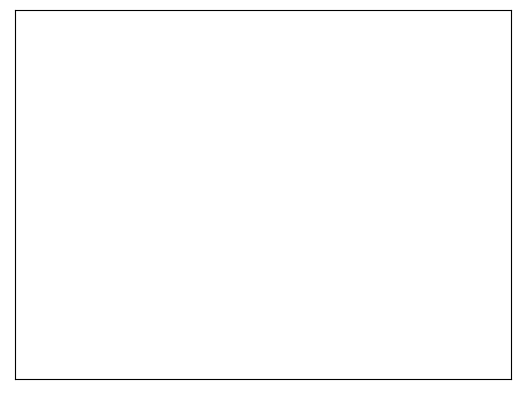

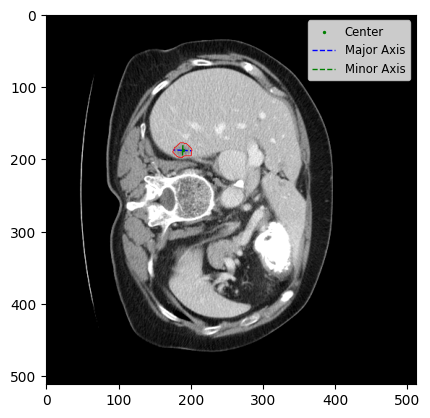

Largest Volume =  464.7216796875  In Slice  72
Distance along major axis: 11.52666584116987
Distance along minor axis: 11.274121229667571
2023-05-16 14:16:13,480 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


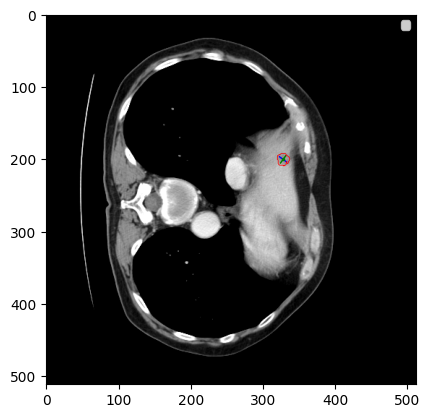

Largest Volume =  363.372802734375  In Slice  60
Distance along major axis: 10.588675433365964
Distance along minor axis: 9.34029264889742
2023-05-16 14:16:15,127 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


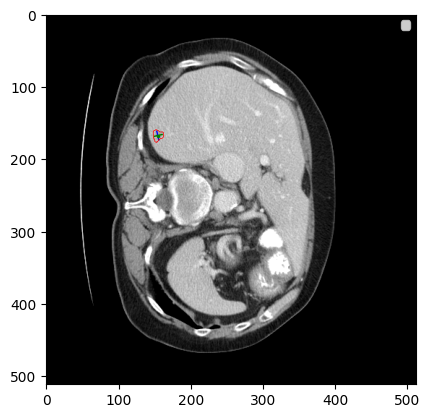

Largest Volume =  229.888916015625  In Slice  69
Distance along major axis: 6.595847363883953
Distance along minor axis: 10.305347077168065
2023-05-16 14:16:17,078 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


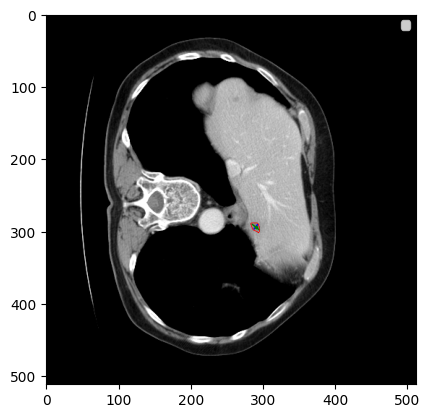

Largest Volume =  229.888916015625  In Slice  61
Distance along major axis: 7.571668140687498
Distance along minor axis: 7.32229341951907
2023-05-16 14:16:19,158 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


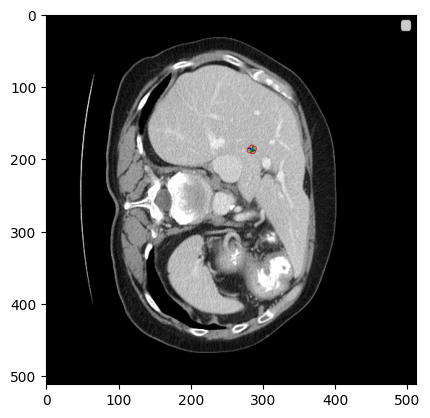

Largest Volume =  192.81005859375  In Slice  58
Distance along major axis: 8.229634879019533
Distance along minor axis: 7.65380083141871
2023-05-16 14:16:21,380 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


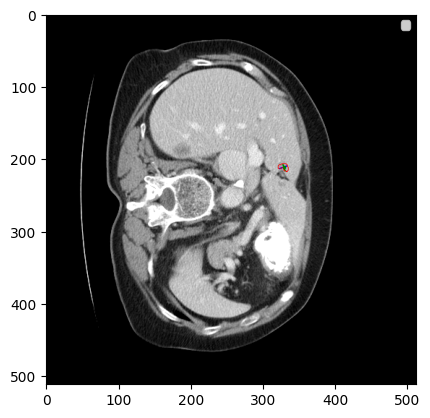

Largest Volume =  180.450439453125  In Slice  67
Distance along major axis: 7.1246071440300724
Distance along minor axis: 5.639426864045221
2023-05-16 14:16:23,483 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


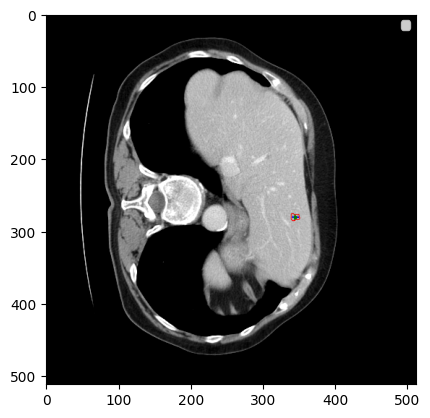

Largest Volume =  242.24853515625  In Slice  66
Distance along major axis: 8.553796921506473
Distance along minor axis: 6.452183895424563
2023-05-16 14:16:25,469 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


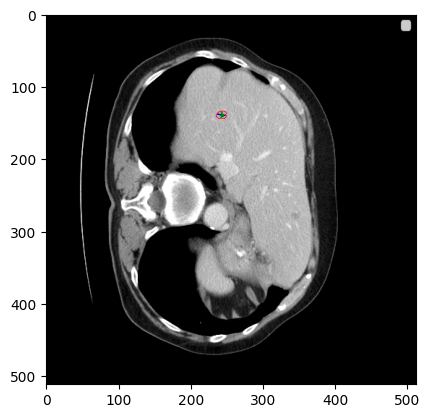

Largest Volume =  128.5400390625  In Slice  58
Distance along major axis: 6.1131391874827194
Distance along minor axis: 6.164336362417328
2023-05-16 14:16:27,594 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


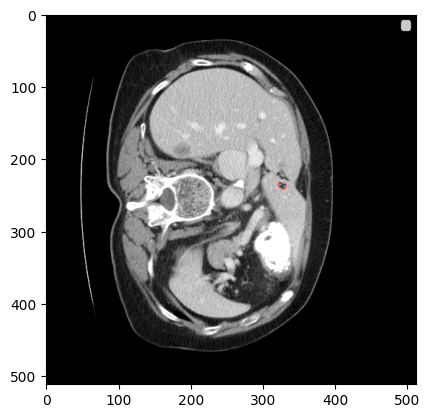

Largest Volume =  113.70849609375  In Slice  46
Distance along major axis: 4.44730482525208
Distance along minor axis: 5.86980891091941
2023-05-16 14:16:29,722 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


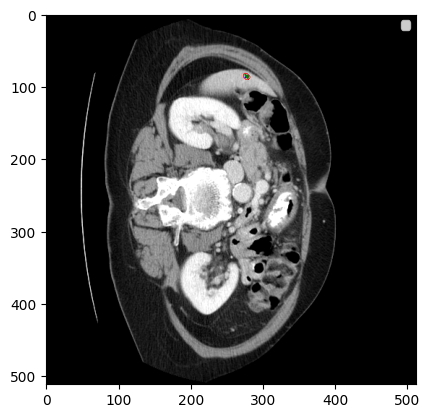

Largest Volume =  106.292724609375  In Slice  69
Distance along major axis: 4.532542773444251
Distance along minor axis: 5.22876680223703
2023-05-16 14:16:31,593 - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


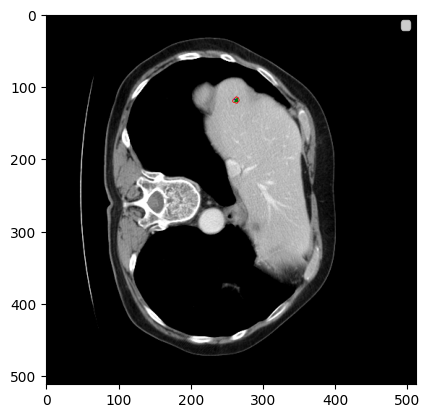

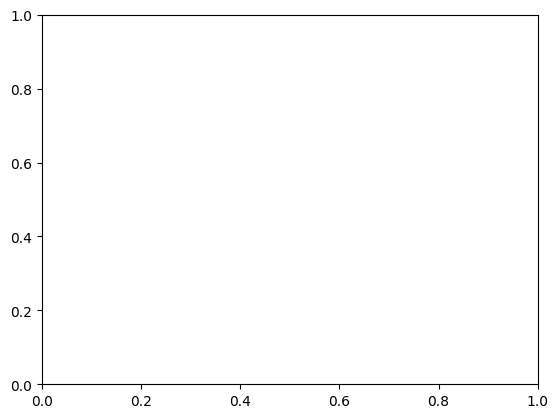

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


In [3]:
from utils import visualization
visualization.visualization_mood(mode='contour')



In [5]:
import nibabel as nib
import
import numpy as np
from monai.transforms import AsDiscrete
from monai.data import DataLoader, Dataset, decollate_batch


In [97]:

from monai.transforms import (
    Compose,
    EnsureChannelFirstD,
    ForegroundMaskD,
    LoadImage,
    LoadImageD,
    NormalizeIntensityD,
    OrientationD,
    RandFlipd,
    RandRotated,
    ResizeD,
    ToTensorD,
    EnsureTyped,
    RandSpatialCropd,
    RandAdjustContrastd,
    RandZoomd,
    Spacingd,
    CropForegroundd,
    Activationsd,
    AsDiscreted,
    KeepLargestConnectedComponent,
    RemoveSmallObjects,
    FillHoles,
    ScaleIntensityRanged,
    Invertd,
    ToTensor,
    RandSpatialCropSamplesd,
    SpatialPadd,
    RandCropByLabelClassesd
)
import matplotlib.pyplot as plt

In [158]:
mask=nib.load("D:/GP/MedSeg/Train/mask/mask9.nii").get_fdata()
volume=nib.load("D:/GP/MedSeg/Train/volume/img9.nii").get_fdata()


In [159]:
print(volume.shape,mask.shape)

(512, 512, 26) (512, 512, 26)


In [194]:
keys=["image","mask"]
pre_transforms=Compose(
                [
                    LoadImageD(keys),
                    EnsureChannelFirstD(keys),
                    OrientationD(keys, axcodes="LAS"),  # preferred by radiologists

                    CropForegroundd(keys=keys, source_key=keys[0]),

                    # RandFlipd(keys, prob=0.5, spatial_axis=2),
                    # RandRotated(keys, range_x=1.5, range_y=0, range_z=0, prob=0.5),                
                    SpatialPadd(keys, (128,128,32),mode ='minimum'),

                    ScaleIntensityRanged(
                        keys=keys[0],
                        a_min=-90,
                        a_max=90,
                        b_min=0.0,
                        b_max=1.0,
                        clip=True,
                    ),
                    RandCropByLabelClassesd(keys,spatial_size=(128,128,32),num_samples=1,num_classes=10,label_key="mask"),
                    ToTensorD(keys),
                ]
            )

In [184]:
volumes_paths = [
"D:/GP/MedSeg/Train/volume/img9.nii"]
masks_paths = [
"D:/GP/MedSeg/Train/mask/mask9.nii"]
data = [
    {"image": "D:/GP/MedSeg/Train/volume/img9.nii", "mask": "D:/GP/MedSeg/Train/mask/mask9.nii"
     }]
# self.pre_transforms = self.get_pretesting_transforms()
test_data = Dataset(data=data, transform=pre_transforms)
test_loader = DataLoader(test_data, batch_size=1, num_workers=0)

(1, 1, 128, 128, 32) (1, 1, 128, 128, 32)


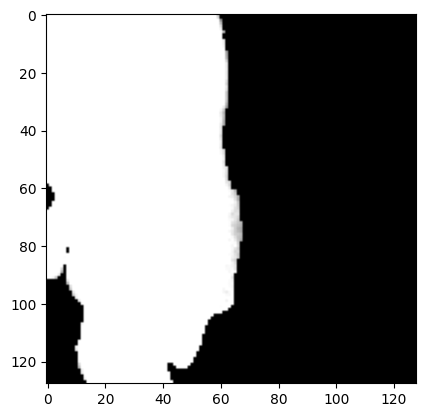

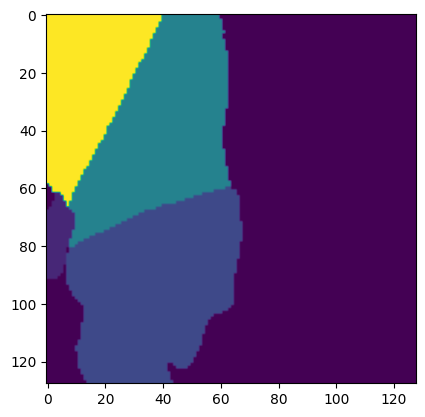

In [204]:
for batch in test_loader:
    volume,mask=batch["image"],batch["mask"]
    print(volume.shape,mask.shape)
    plt.imshow(volume[0][0][:,:,20],cmap='gray')
    plt.show()
    plt.imshow(mask[0][0][:,:,20])
